In [16]:
%matplotlib inline
import os, sys
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import matplotlib.pyplot as plt
import numpy as np
import cv2
import re
import util
from model import AffineNet
from model import NetMain
import train

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [11]:
path = "DATA2/Results/AffineNetwork/"

imgs_rgb_train, imgs_ir_train = util.loadDataset(path, "train/rgb", "train/ir")

imgs_mask_rgb_train, imgs_mask_ir_train = util.loadDataset(path, "train/mask_rgb", "train/mask_ir", color=False)

In [3]:
imgs_rgb_test, imgs_ir_test = util.loadDataset(path, "test/rgb", "test/ir")

imgs_mask_rgb_test, imgs_mask_ir_test = util.loadDataset(path, "test/mask_rgb", "test/mask_ir", color=False)

In [5]:
imgs_rgb_val, imgs_ir_val = util.loadDataset(path, "validation/rgb", "validation/ir")

imgs_mask_rgb_val, imgs_mask_ir_val = util.loadDataset(path, "validation/mask_rgb", "validation/mask_ir", color=False)

In [6]:
imgs_rgb_train.shape, imgs_mask_rgb_train.shape, imgs_rgb_test.shape, imgs_rgb_val.shape

((8000, 240, 320, 3),
 (8000, 240, 320, 3),
 (1400, 240, 320, 3),
 (1000, 240, 320, 3))

In [10]:
imgs_mask_rgb_test.shape

(1400, 240, 320)

In [12]:
beg = 0
end = 8000

imRGB = util.parseImages(imgs_mask_rgb_train, end)
imRGB = imRGB[beg:end, ...]

imIR = util.parseImages(imgs_mask_ir_train, end)
imIR = imIR[beg:end, ...]

imIR.shape

torch.Size([8000, 1, 240, 320])

In [13]:
beg = 0
end = 1000

imRGB_test = util.parseImages(imgs_mask_rgb_val, end)
imRGB_test = imRGB_test[beg:end, ...]

imIR_test = util.parseImages(imgs_mask_ir_val, end)
imIR_test = imIR_test[beg:end, ...]

imIR_test.shape

torch.Size([1000, 1, 240, 320])

In [32]:
model = NetMain(imgs_mask_rgb_train.shape[1:]).to(device)

In [33]:
mini_batch_size = 20
optimizer = optim.Adam(model.parameters(), lr=1e-4)
criterion = nn.MSELoss()

In [34]:
model = model.to(device)

res = train.trainAndVal(model, imRGB, imIR, 100, mini_batch_size, criterion, optimizer, imRGB_test, imIR_test, 'netmain', 1.0)

epoch 1: loss = 54.18767544440925
epoch 2: loss = 46.777975561097264
epoch 3: loss = 43.1472376678139
epoch 4: loss = 41.51098599471152
epoch 5: loss = 40.55196565203369
epoch 6: loss = 39.820195484906435
epoch 7: loss = 39.172948874533176
epoch 8: loss = 38.645106909796596
epoch 9: loss = 38.211914071813226
epoch 10: loss = 37.82480475213379
epoch 11: loss = 37.45840764045715
epoch 12: loss = 37.138716478832066
epoch 13: loss = 36.85204468946904
epoch 14: loss = 36.59417487308383
epoch 15: loss = 36.35645132511854
epoch 16: loss = 36.13798160664737
epoch 17: loss = 35.91241991985589
epoch 18: loss = 35.63890098128468
epoch 19: loss = 35.40094640944153
epoch 20: loss = 35.18664272874594
epoch 21: loss = 35.018986355513334
epoch 22: loss = 34.86872606817633
epoch 23: loss = 34.73997324425727
epoch 24: loss = 34.61940246447921
epoch 25: loss = 34.49171788711101
epoch 26: loss = 34.381592764519155
epoch 27: loss = 34.26647183764726
epoch 28: loss = 34.15942949522287
epoch 29: loss = 34.06

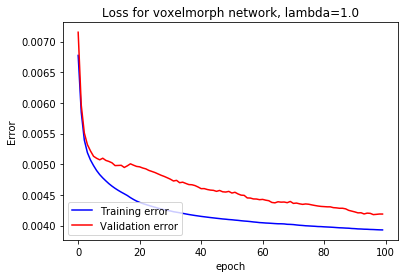

In [38]:
x = list(range(0, 100))
fig = plt.figure()
ax = plt.axes()
plt.plot(x, res[0], color='blue', linestyle='solid', label='Training error')
plt.plot(x, res[1], color='red', linestyle='solid', label='Validation error')
plt.title("Loss for voxelmorph network, lambda=1.0")
plt.legend(loc='lower left')
ax = ax.set(xlabel='epoch', ylabel='Error')

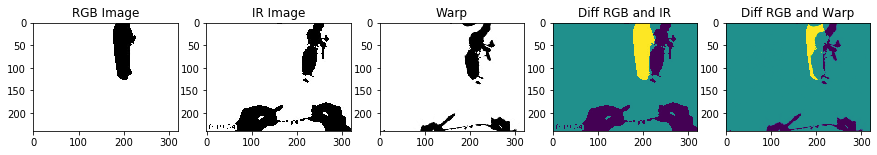

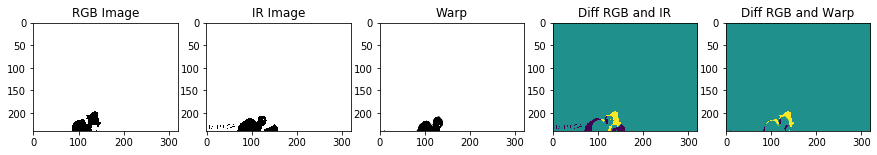

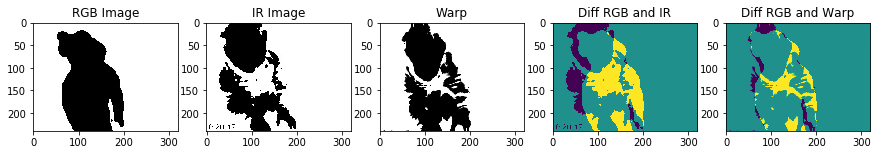

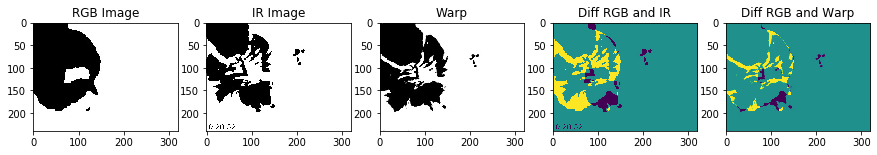

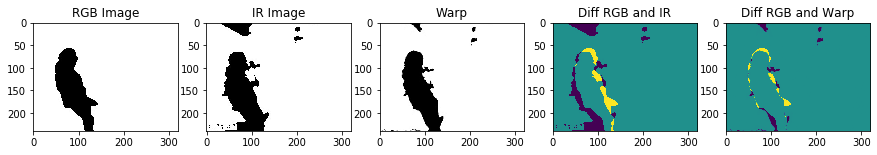

...

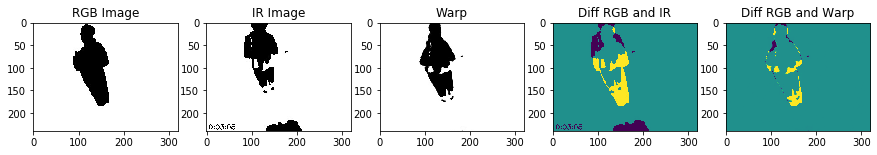

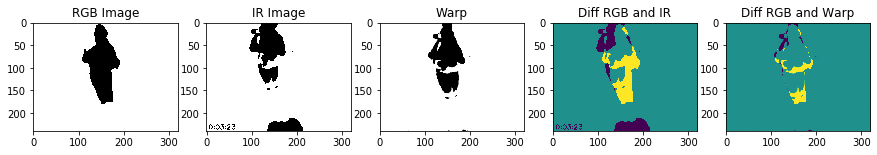

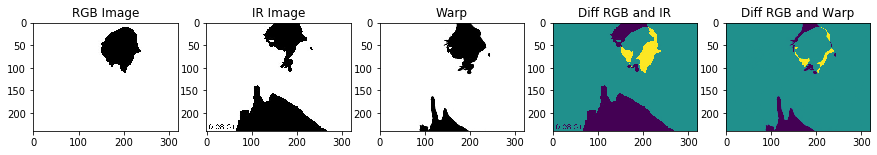

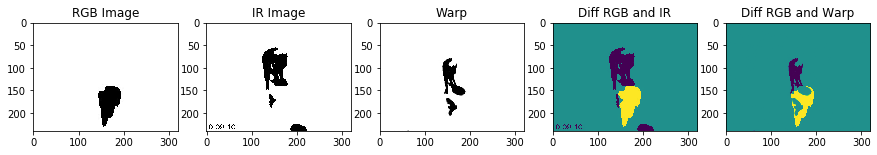

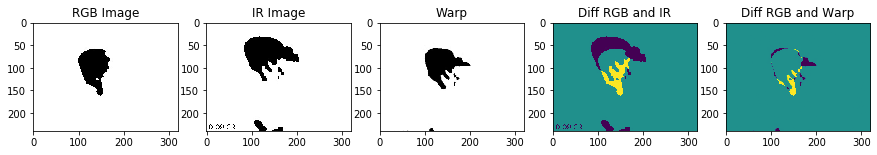

In [39]:
for i in range(0, 8000, 100):
    util.printResult(*util.getImagesById(imRGB.cpu(), imIR.cpu(), i, model.cpu()), cmap='viridis')

In [40]:
beg = 1000
end = 2400

imRGB_test2 = util.parseImages(imgs_mask_rgb_test, end)
imRGB_test2 = imRGB_test2[beg:end, ...]

imIR_test2 = util.parseImages(imgs_mask_ir_test, end)
imIR_test2 = imIR_test2[beg:end, ...]

imIR_test2.shape

torch.Size([400, 1, 240, 320])

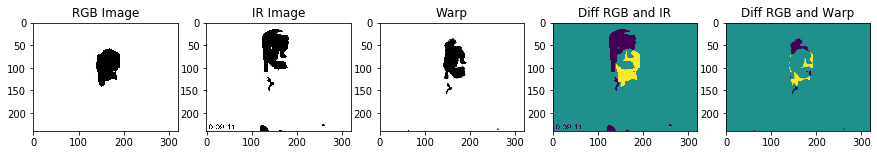

In [41]:
with torch.no_grad():
    util.printResult(*util.getImagesById(imRGB_test2.cpu(), imIR_test2.cpu(), 390, model.cpu()), cmap='viridis')

In [42]:
flows = util.getAllFlows(imIR, imRGB, model)

flows.shape

torch.Size([8000, 2, 240, 320])

In [43]:
x = util.applyFlowToColoredImages_netMain(imgs_ir_train, flows[1000:2000], 1000, 2000, model)
x.shape

(1000, 240, 320, 3)

In [44]:
superposedImages = util.superposeTwoImages(imgs_rgb_train[1000:2000], (x*255).astype('uint8'))
superposedImages2 = util.superposeTwoImages(imgs_rgb_train[1000:2000], imgs_ir_train[1000:2000])
print(superposedImages.shape, superposedImages2.shape)

(1000, 240, 320, 3) (1000, 240, 320, 3)


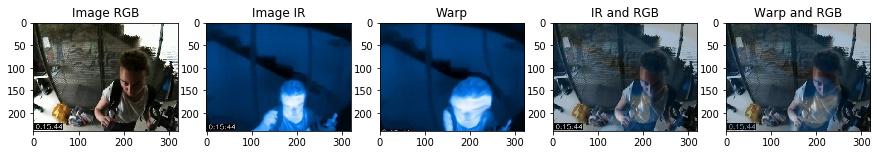

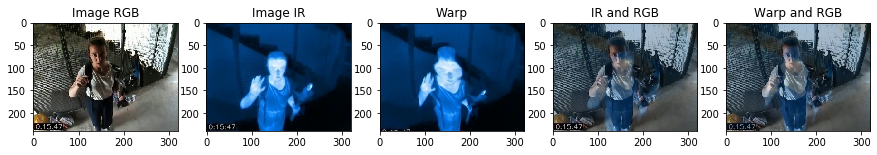

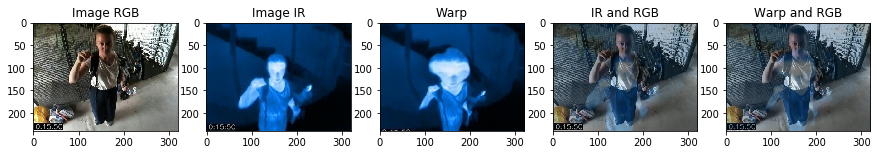

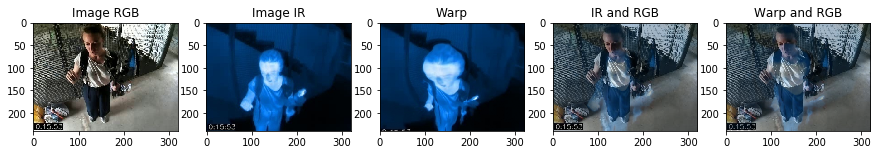

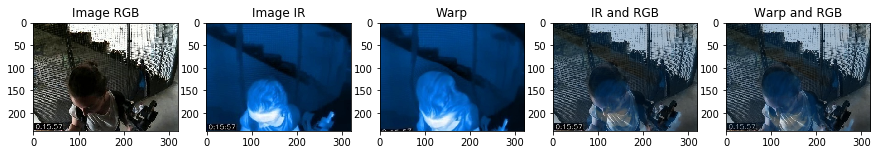

...

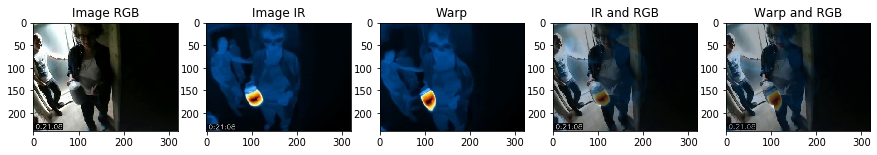

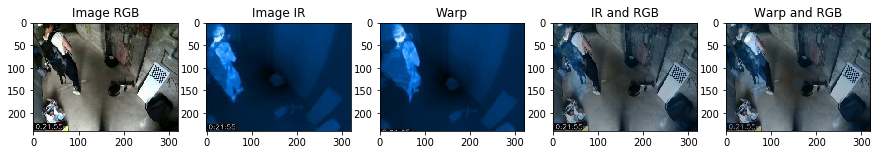

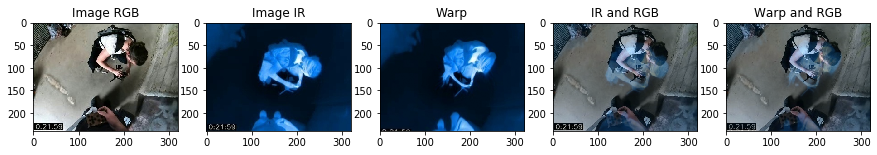

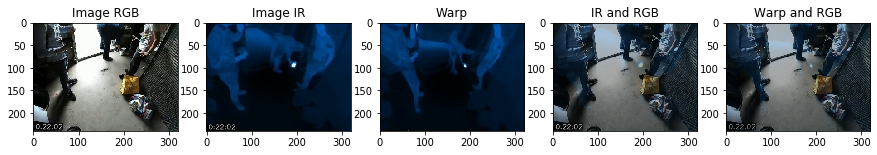

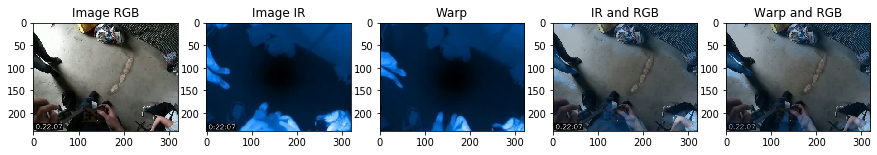

In [45]:
for i in range(0, 1000, 20):
    util.printFinal(x[i], imgs_rgb_train[i+1000], imgs_ir_train[i+1000], superposedImages[i], superposedImages2[i])

In [36]:
torch.save(model.state_dict(), "Model/model_voxelmorph_segmentation_e100_p10.pt")